In [1]:
import random
from tqdm import tqdm
import networkx as nx
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from zipfile import ZipFile

In [4]:
!wget https://github.com/abcom-mltutorials/Facebook-Social-Network-Analysis/archive/master.zip 

--2022-08-01 12:32:16--  https://github.com/abcom-mltutorials/Facebook-Social-Network-Analysis/archive/master.zip
Resolving github.com (github.com)... 13.234.176.102
Connecting to github.com (github.com)|13.234.176.102|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://codeload.github.com/abcom-mltutorials/Facebook-Social-Network-Analysis/zip/refs/heads/master [following]
--2022-08-01 12:32:17--  https://codeload.github.com/abcom-mltutorials/Facebook-Social-Network-Analysis/zip/refs/heads/master
Resolving codeload.github.com (codeload.github.com)... 140.82.121.9
Connecting to codeload.github.com (codeload.github.com)|140.82.121.9|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘master.zip’

master.zip              [   <=>              ]   1.35M  2.75MB/s    in 0.5s    

2022-08-01 12:32:18 (2.75 MB/s) - ‘master.zip’ saved [1415226]



In [5]:
!unzip master.zip

Archive:  master.zip
7f71787187c3609db271abe333a8ffdb9a0a04ad
   creating: Facebook-Social-Network-Analysis-master/
  inflating: Facebook-Social-Network-Analysis-master/.gitattributes  
  inflating: Facebook-Social-Network-Analysis-master/Graph.pickle  
  inflating: Facebook-Social-Network-Analysis-master/SNA Visualisation.ipynb  
  inflating: Facebook-Social-Network-Analysis-master/df1.csv  
   creating: Facebook-Social-Network-Analysis-master/facebook/
  inflating: Facebook-Social-Network-Analysis-master/facebook/0.circles  
  inflating: Facebook-Social-Network-Analysis-master/facebook/0.edges  
  inflating: Facebook-Social-Network-Analysis-master/facebook/0.egofeat  
  inflating: Facebook-Social-Network-Analysis-master/facebook/0.feat  
  inflating: Facebook-Social-Network-Analysis-master/facebook/0.featnames  
  inflating: Facebook-Social-Network-Analysis-master/facebook/107.circles  
  inflating: Facebook-Social-Network-Analysis-master/facebook/107.edges  
  inflating: Facebook-So

In [6]:
fb = pd.read_csv('Facebook-Social-Network-Analysis-master/facebook_combined.txt', delim_whitespace=True, names=['Source', 'Destination'])

In [7]:
fb

,Source,Destination
0,0,1
1,0,2
2,0,3
3,0,4
4,0,5
...,...,...
88229,4026,4030
88230,4027,4031
88231,4027,4032
88232,4027,4038


In [8]:
with open('Facebook-Social-Network-Analysis-master/facebook/0.featnames', 'r') as f:
       feature_names = f.readlines()
feature_names_df = pd.read_csv('Facebook-Social-Network-Analysis-master/facebook/0.featnames', names=['Feature Names'])
feature_names_df

,Feature Names
0,0 birthday;anonymized feature 0
1,1 birthday;anonymized feature 1
2,2 birthday;anonymized feature 2
3,3 birthday;anonymized feature 3
4,4 birthday;anonymized feature 4
...,...
219,219 work;start_date;anonymized feature 170
220,220 work;start_date;anonymized feature 171
221,221 work;start_date;anonymized feature 203
222,222 work;start_date;anonymized feature 204


In [9]:
unique_features = []
 
for i in range(len(feature_names)):
    feature_names[i] = feature_names[i].split(' ', 1)[1]
    feature_names[i] = feature_names[i].rsplit(';' , 1)[0]
    unique_features.append(feature_names[i])

list(set(unique_features))

['location;id',
 'work;end_date',
 'birthday',
 'education;school;id',
 'education;type',
 'last_name',
 'locale',
 'languages;id',
 'education;concentration;id',
 'work;with;id',
 'first_name',
 'work;employer;id',
 'gender',
 'work;start_date',
 'work;position;id',
 'education;year;id',
 'education;with;id',
 'work;location;id',
 'hometown;id',
 'education;degree;id',
 'education;classes;id']

In [10]:
def ExtractFeatureNames(path):
    with open(path, 'r') as f:
        feature_names = f.readlines()
 
    for i in range(len(feature_names)):
        feature_names[i] = feature_names[i].split(' ', 1)[1]
        feature_names[i] = feature_names[i].rsplit('\n' , 1)[0]
        feature_names[i] = feature_names[i].rsplit(';' , 1)
        feature_names[i][1] = feature_names[i][1].rsplit(' ' , 1)[1]

    return feature_names

In [12]:
l = ['0','107','348','414','686','698','1684','1912','3437','3980']

In [14]:
node_features = []
for i in l:
   df = pd.read_csv('Facebook-Social-Network-Analysis-master/facebook/'+i +'.feat',
                    delim_whitespace=True, names=pd.MultiIndex.from_tuples(ExtractFeatureNames('Facebook-Social-Network-Analysis-master/facebook/'+i +'.featnames'))).T
   node_features.append(df.loc[['location;id','education;school;id']])


In [15]:
node_features

[                         1    2    3    4    5    6    7    8    9    10   \
 location;id         128    0    0    0    0    0    0    0    0    0    0   
                     129    0    0    0    0    0    0    0    0    0    0   
                     130    0    0    0    0    0    0    0    0    0    0   
                     131    0    0    0    0    0    0    0    0    0    0   
                     132    0    0    0    0    0    0    0    0    0    0   
                     133    0    0    0    0    0    0    0    0    0    0   
                     134    0    0    0    0    0    0    0    0    0    0   
                     135    0    1    0    0    0    0    0    0    0    0   
                     136    0    0    0    0    0    0    0    0    0    0   
                     88     0    0    0    0    0    0    0    0    0    0   
                     137    0    0    1    0    0    0    1    0    0    1   
                     138    0    0    0    0    0    0    0    0

In [21]:
node_attributes = {}
for i in node_features:
    a = {j : i[i[j] == 1][j].index.tolist()[:2] for j in i.columns if len(i[i[j] == 1][j].index.tolist())>1 and 
                                                                 i[i[j] == 1][j].index.tolist()[0][0] == 'location;id'}
    node_attributes.update(a)

#creating the nested dictionary
for k,v in node_attributes.items():
    node_attributes[k] = {i[0] : i[1] for i in node_attributes[k]}
    
#sorting the dictionary
node_attributes = {i[0]: i[1] for i in sorted(node_attributes.items())}

In [22]:
list(node_attributes.items())[:10]


[(2, {'location;id': '135', 'education;school;id': '35'}),
 (3, {'location;id': '137', 'education;school;id': '34'}),
 (7, {'location;id': '137', 'education;school;id': '25'}),
 (10, {'location;id': '137', 'education;school;id': '50'}),
 (13, {'location;id': '137', 'education;school;id': '50'}),
 (16, {'location;id': '137', 'education;school;id': '50'}),
 (17, {'location;id': '129', 'education;school;id': '28'}),
 (23, {'location;id': '132', 'education;school;id': '47'}),
 (24, {'location;id': '132', 'education;school;id': '50'}),
 (25, {'location;id': '132', 'education;school;id': '47'})]

In [23]:
#dropping the extra nodes from 'fb' that are not in 'node_attributes' 
no_att_source = list(set([i for i in fb.Source]) - set(node_attributes.keys()))
no_att_dest = list(set([i for i in fb.Destination]) - set(node_attributes.keys()))

#finding indices of the above nodes in fb and dropping them
idx = []
for i in no_att_source:
    idx.extend(fb.index[fb.Source == i].tolist())
    
fb.drop(list(set(idx)), axis=0, inplace=True)
    
idx = []    
for i in no_att_dest:    
    idx.extend(fb.index[fb.Destination == i].tolist())
    
fb.drop(list(set(idx)), axis=0, inplace=True)

In [24]:
#creating a list of node pair tuples from the 'fb' dataframe
existing_edges = [(fb.iloc[i,0],fb.iloc[i,1]) for i in range(fb.shape[0])]

#printing first 20 existing edges/node pairs
existing_edges[:5]

[(2, 116), (2, 226), (2, 326), (3, 25), (3, 67)]

In [25]:
G = nx.Graph()

In [27]:
for i in node_attributes.keys():
    G.add_node(i)

In [28]:
G.add_edges_from(existing_edges)

In [29]:
nx.set_node_attributes(G, node_attributes)

In [32]:
nx.info(G)

/tmp/ipykernel_13297/1064119803.py:1: DeprecationWarning: info is deprecated and will be removed in version 3.0.

  nx.info(G)


'Graph with 1447 nodes and 18476 edges'

In [33]:
deg = [i for i in G if G.degree(i) <3]
G.remove_nodes_from(deg)
print(nx.info(G))

Graph with 1295 nodes and 18321 edges


/tmp/ipykernel_13297/1692801022.py:3: DeprecationWarning: info is deprecated and will be removed in version 3.0.

  print(nx.info(G))


In [34]:
fb = pd.DataFrame(data=list(G.edges()), columns=['Node 1', 'Node 2'])
fb.head()

,Node 1,Node 2
0,2,116
1,2,226
2,2,326
3,3,25
4,3,67


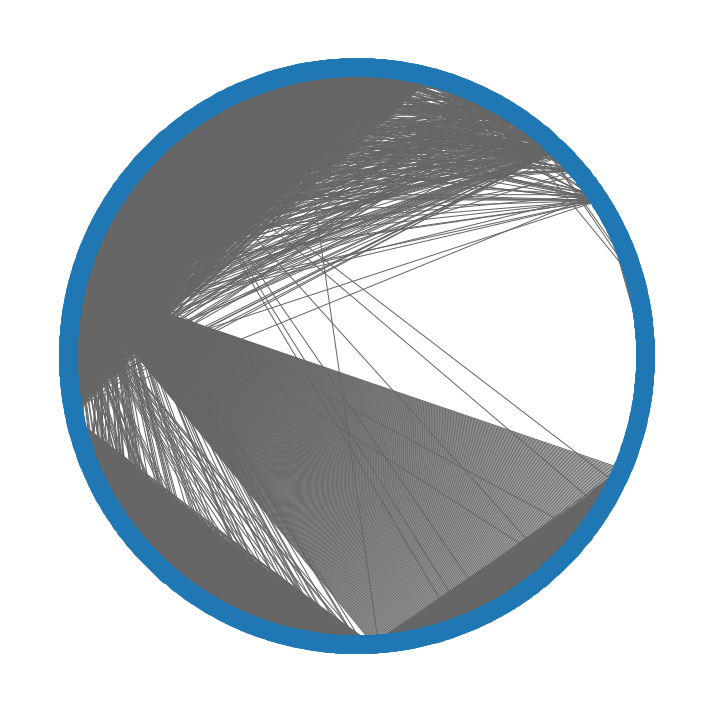

In [35]:
plt.figure(figsize=(10,10))
pos = nx.circular_layout(G)
nx.draw_networkx(G, pos, with_labels=False, edge_color='.4')
 
plt.axis('off')
plt.tight_layout();

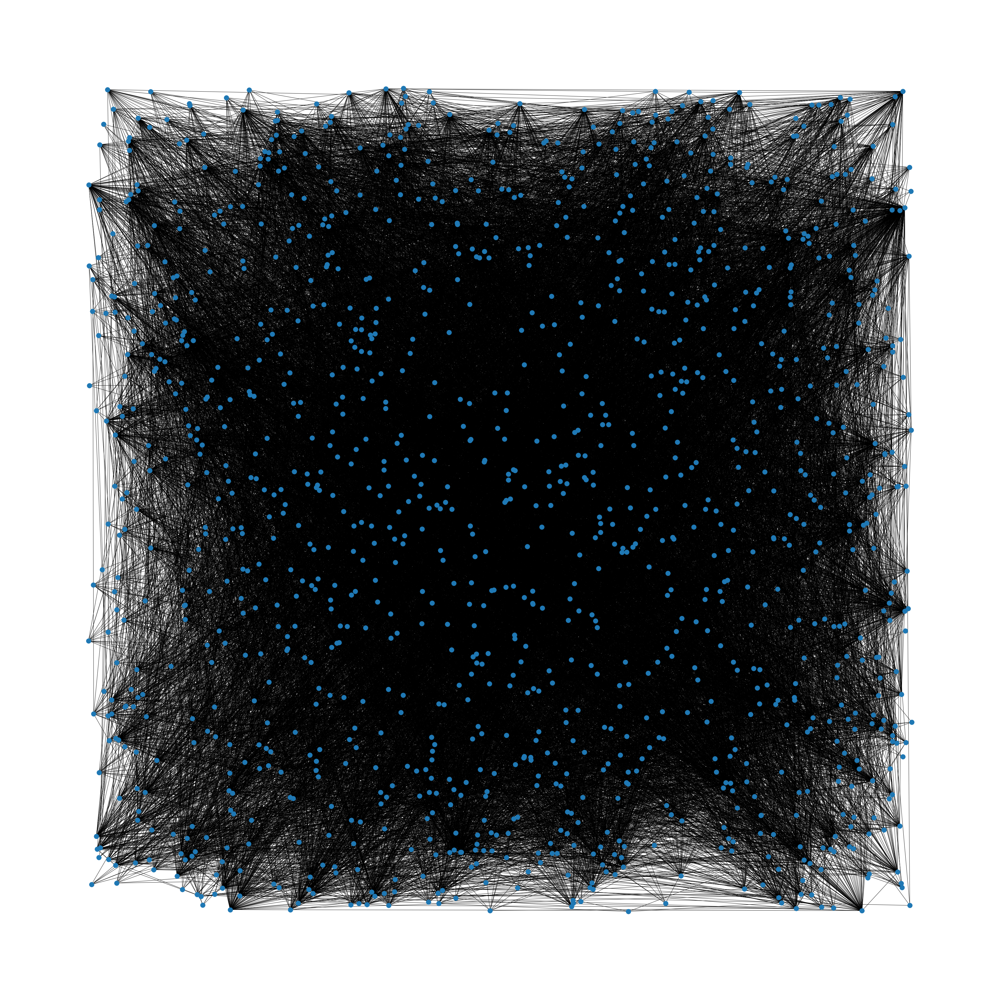

In [36]:
plt.figure(figsize=(50,50))
pos = nx.random_layout(G)
nx.draw_networkx(G, pos, with_labels=False)
 
plt.axis('off')
plt.tight_layout();

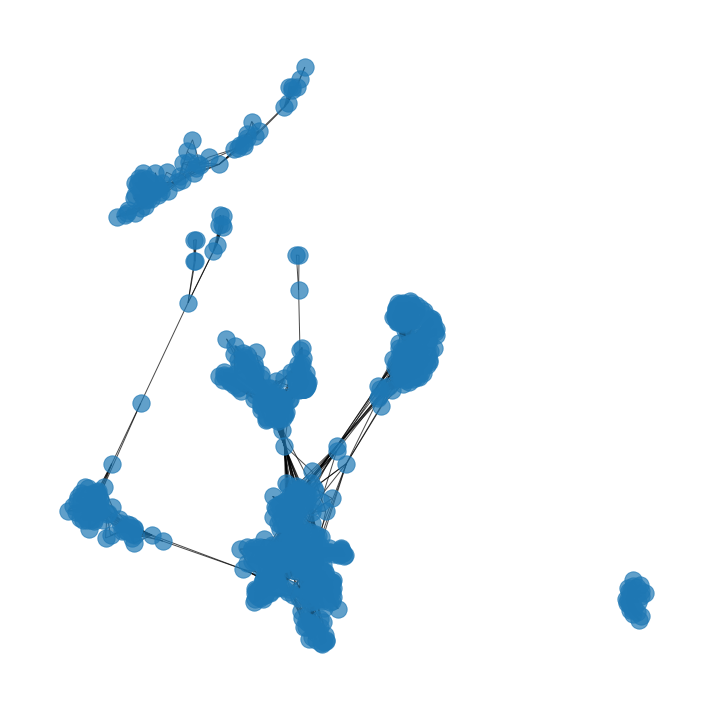

In [37]:
plt.figure(figsize=(10,10))
nx.draw_networkx(G, alpha=0.7, with_labels=False)
plt.axis('off')
plt.tight_layout();

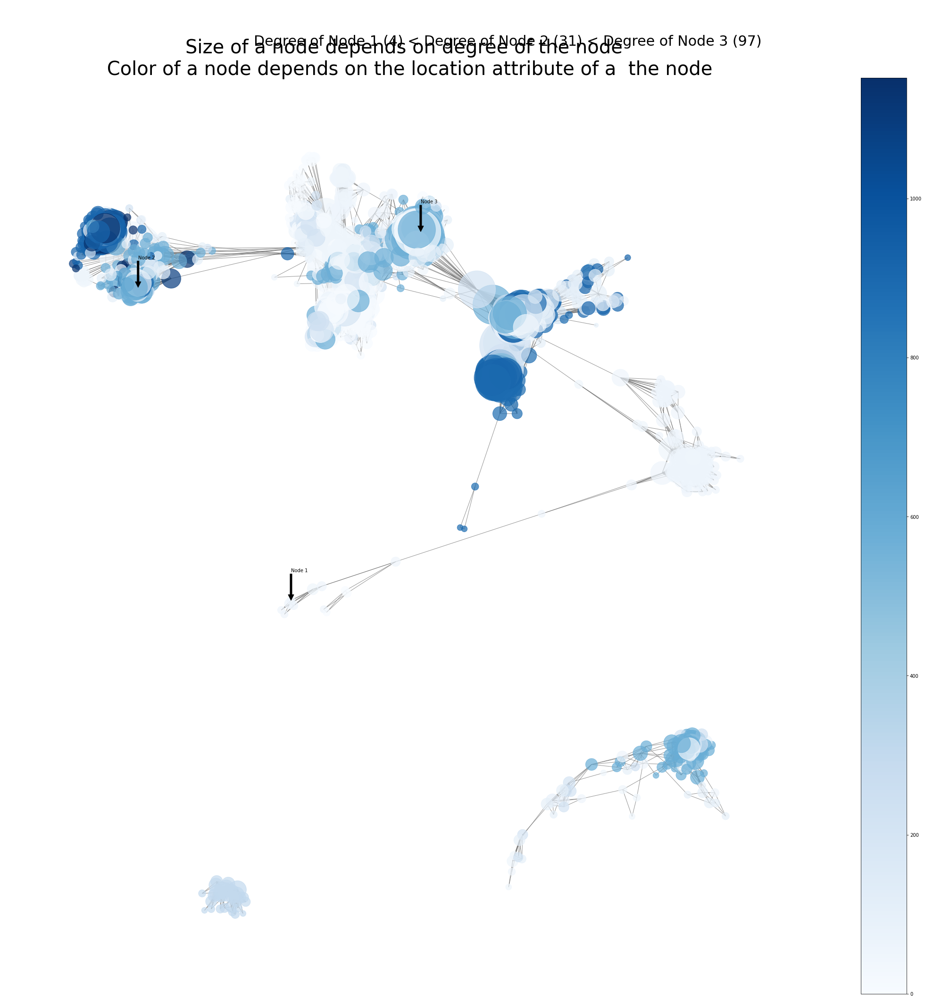

In [38]:
plt.figure(figsize=(30,30))
 
# node size is based on the degree of the node
node_size = [80*G.degree(v) for v in G]
 
# node color is based on the node attribute/feature value
node_color = [int(nx.get_node_attributes(G, 'location;id')[v]) for v in G]
 
colors=range(max(node_color))
cmap=plt.cm.Blues
vmin = min(colors)
vmax = max(colors)
 
# drawing graph with custom node size and color
# using spring layout
pos = nx.spring_layout(G)
nx.draw_networkx(G, pos, node_size=node_size,
                node_color=node_color, alpha=0.7,
                with_labels=False,
                edge_color='.4', cmap=cmap)
 
# getting the values according to attributes
# for the colorbar
sm = plt.cm.ScalarMappable(cmap=cmap,
                          norm=plt.Normalize(
                              vmin = vmin, vmax=vmax))
sm._A = []
 
plt.title('Size of a node depends on degree of the node \n Color of a node depends on the location attribute of a  the node', fontsize=40)
plt.axis('off')
plt.colorbar(sm)
 
#plotting annotations for different nodes
ax = plt.gca()
ax.annotate("Node 1", xy=pos.get(17), xytext=(0, 60),
           textcoords='offset points',
           arrowprops=dict(facecolor='black'))
 
ax1 = plt.gca()
ax1.annotate("Node 2", xy=pos.get(3280), xytext=(0, 60),
            textcoords='offset points',
            arrowprops=dict(facecolor='black'))
 
ax2 = plt.gca()
ax2.annotate("Node 3", xy=pos.get(1078), xytext=(0, 60), textcoords='offset points',
            arrowprops=dict(facecolor='black'))
 
plt.suptitle('\n\nDegree of Node 1 (4) < Degree of Node 2 (31) < Degree of Node 3 (97)', fontsize=30)
 
plt.tight_layout();

In [39]:
#saving the graph
nx.write_gpickle(G,'Facebook-Social-Network-Analysis-master/Graph.pickle')

#saving the dataframe
fb.to_csv('Facebook-Social-Network-Analysis-master/fb.csv', index=False)